# Goal of the notebook

**This is the first attempt to fine-tune the existing yolo models for food detection. We showed that it is highly doable, and identified the issues we need to resolve while further working on the taks**

In [1]:
import ultralytics
import cv2
from ultralytics import YOLO
import supervision as sv
from constants import api_key
import os
from datetime import datetime
from PIL import Image, ImageDraw, ImageFont
from IPython.display import Image as IPImage, display
import matplotlib.pyplot as plt
import torch

In [2]:
#! mkdir images

In [3]:
#! mkdir output_images

### We will use yolo11s model for now (small version of the YOLOv11 model)

In [4]:
from object_detection import detect_objects
model = YOLO("model_weights/yolo11s.pt")
image_path = 'images/chicken_nuggets.jpg'
detect_objects(model, image_path, name_images='nuggets')


0: 640x640 2 donuts, 526.0ms
Speed: 5.3ms preprocess, 526.0ms inference, 13.7ms postprocess per image at shape (1, 3, 640, 640)
Detection completed! Found 2 objects
Labeled image saved to: output_images/nuggets.png


{'object_count': 2,
 'class_counts': {'donut': 2},
 'original_image': 'images/chicken_nuggets.jpg',
 'labeled_image': 'output_images/nuggets.png'}

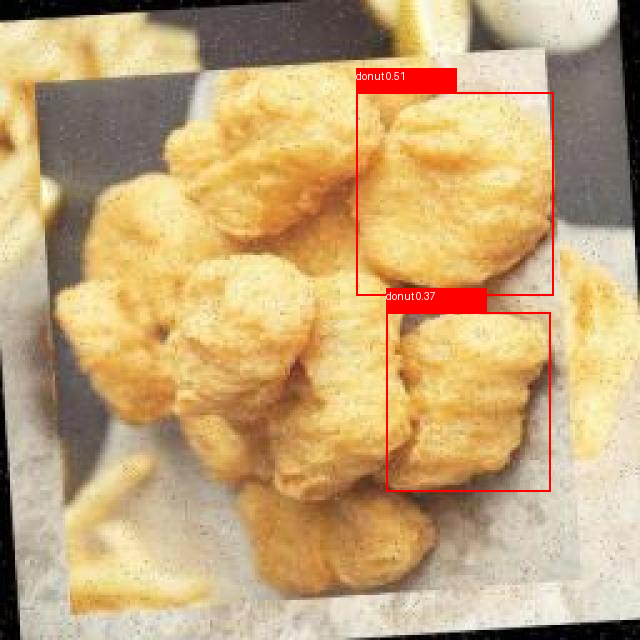

In [5]:
display(IPImage(filename='output_images/nuggets.png'))

### We see that the quality is not good. Can we do better?

### Fine-tune YOLOv11 on food images

### About roboflow: https://roboflow.com/

+ Contains many datasets helpful for object detection

+ Datasets can be filtered (by number of images, and so on)

+ Datasets can be downloaded for different yolo verstion formats

+ They have datasets for food object detection, calorie estimation, ingredient identification, and so on (we need to check if they work good for out tasks)

+ Alternatively, it is very simple and straighforward to create the dataset by our own (see https://www.youtube.com/watch?v=etjkjZoG2F0&list=LL&index=3&t=2080s)

### For now we will use the following dataset: https://universe.roboflow.com/ai-nutrient-tracker/object-detection-ez3ce

In [10]:
from roboflow import Roboflow
rf = Roboflow(api_key=api_key)
project = rf.workspace("ai-nutrient-tracker").project("object-detection-ez3ce")
version = project.version(1)
dataset = version.download("yolov11")

loading Roboflow workspace...
loading Roboflow project...


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#device = torch.device('mps' if torch.backends.mps.is_available() else 'cpu')
device

In [13]:
path_data = 'ENTER PATH TO data.yaml'

In [ ]:
# https://github.com/darg93/YOLOv11n-fine-tuning/blob/master/YOLOv11n_fine_tuning_byteboarder.ipynb
# ran for 65 epochs before it stopped due to the patience parameter
model1 = YOLO("model_weights/yolo11s.pt")
results = model1.train(
        data=path_data,
        epochs=200,
        workers=8,
        imgsz=640,
        device=device,
        name="train",
        patience=10 #Epochs to wait for no observable improvement for early stopping of training.
        )

# Evaluate model performance on the validation set
metrics = model1.val()

### Besides the yolo11s model, I also fine-tuned the yolov8s model, so that we could compare the results. I decided to freeze the first 10 layers of the model to preserve the original architecture. I did this because initially I thought that not freezing the layers was the reason why the model was not performing good (turns out that is not the case, we will discuss it later in this notebook)

In [ ]:
model = YOLO("model_weights/yolov8s.pt")

# Custom training parameters
training_config = {
    "data": path_data,
    "epochs": 200,
    "imgsz": 640,
    "lr0": 0.001,  # Initial learning rate
    "lrf": 0.01,   # Final learning rate (cosine decay)
    "momentum": 0.9,
    "weight_decay": 0.0005,
    "cache": "ram",  # Accelerate training
    "patience": 10,  # Early stopping patience (epochs without improvement)
    "freeze": [0, 10]  # Freeze first 10 layers
}

# --- Start Training ---
# the training process stopped after 36 epochs, but it was almost sufficient for the convergence, so it is okay
results = model.train(**training_config)
# Evaluate model performance on the validation set
metrics = model.val()

### Check the performance of the new fine-tuned models (compare with the original model)

In [12]:
from object_detection import detect_with_confidence, plot_boxes, print_labels
model_original = YOLO("model_weights/yolo11s.pt")
model_fine_tuned_8 = YOLO('model_weights/best_v8s.pt')
model_fine_tuned_11 = YOLO("model_weights/best_v11.pt")
for image_path in os.listdir("images"):
    if image_path != '.DS_Store':
        image_path = "images/" + image_path
        print('File name:', image_path)
        results_original = model_original.predict(image_path, conf=0.1, verbose=False)
        results_fine_tuned_8 = model_fine_tuned_8.predict(image_path, conf=0.1, verbose=False)
        results_fine_tuned_11 = model_fine_tuned_11.predict(image_path, conf=0.1, verbose=False)
        print()
        print("Original model labels:")
        print_labels(results_original, model_original)
        print()
        print("Fine-tuned 8 model labels:")
        print_labels(results_fine_tuned_8, model_fine_tuned_8)
        print()
        print("Fine-tuned 11 model labels:")
        print_labels(results_fine_tuned_11, model_fine_tuned_11)
        print()
        print()

File name: images/chinese_cabbage.jpg

Original model labels:
oven

Fine-tuned 8 model labels:
carrot_eggs, chinese_cabbage, fried_dumplings, fried_chicken

Fine-tuned 11 model labels:
fried_dumplings, chinese_cabbage, carrot_eggs


File name: images/water_spinach.jpg

Original model labels:
carrot, carrot, carrot, donut

Fine-tuned 8 model labels:
rice, water_spinach, fried_dumplings, chicken_nuggets

Fine-tuned 11 model labels:
water_spinach


File name: images/chicken_nuggets.jpg

Original model labels:
donut, donut, donut

Fine-tuned 8 model labels:
chicken_nuggets, triangle_hash_brown

Fine-tuned 11 model labels:
chicken_nuggets


File name: images/fried_chicken.jpg

Original model labels:
person

Fine-tuned 8 model labels:
fried_chicken, rice, triangle_hash_brown

Fine-tuned 11 model labels:
fried_chicken


File name: images/fried_dumplings.jpg

Original model labels:
cake

Fine-tuned 8 model labels:
fried_dumplings, triangle_hash_brown

Fine-tuned 11 model labels:
fried_dumpling

### Interpretation

**The file names contain the name of the original food item that we want to recognize. And we see that both fined-tuned models perform very well, recognizing all the food items correctly. The original model performs way worse than the fine-tuned version, failing to recognize all the food items, and sometimes confusing food with some other items (like person, oven, etc). Hence, the results of the fine-tuning are successful. Note that most of the images for this result check are taken from the test set, so the model did not see them while being fine-tuned**

**Yolov11 performed better than Yolov8, because it gave less predictions for each image. In our case it means that it provided less misclassifications, and was more precise**

### The problem is that everything is not so good

**Even though the items were recognized very well, there is one big issue with bounding boxes. They are predicted very poorly. We can see this by visualizing the predictions**

images/chinese_cabbage.jpg


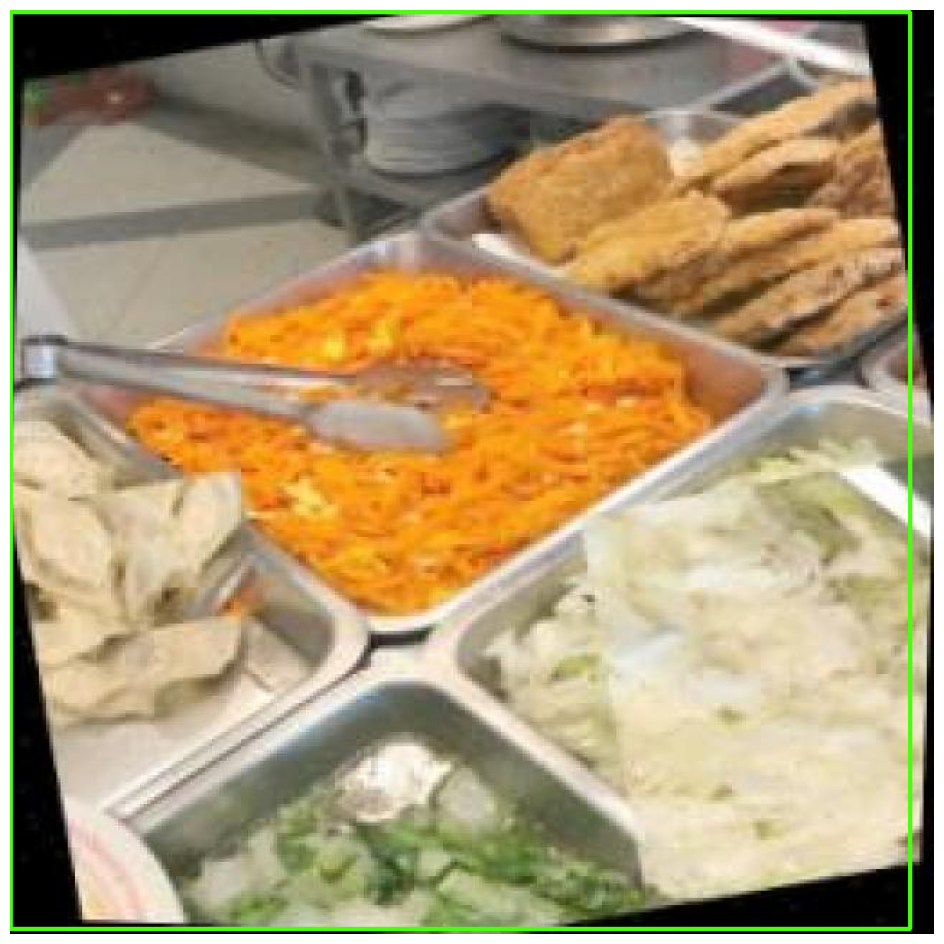

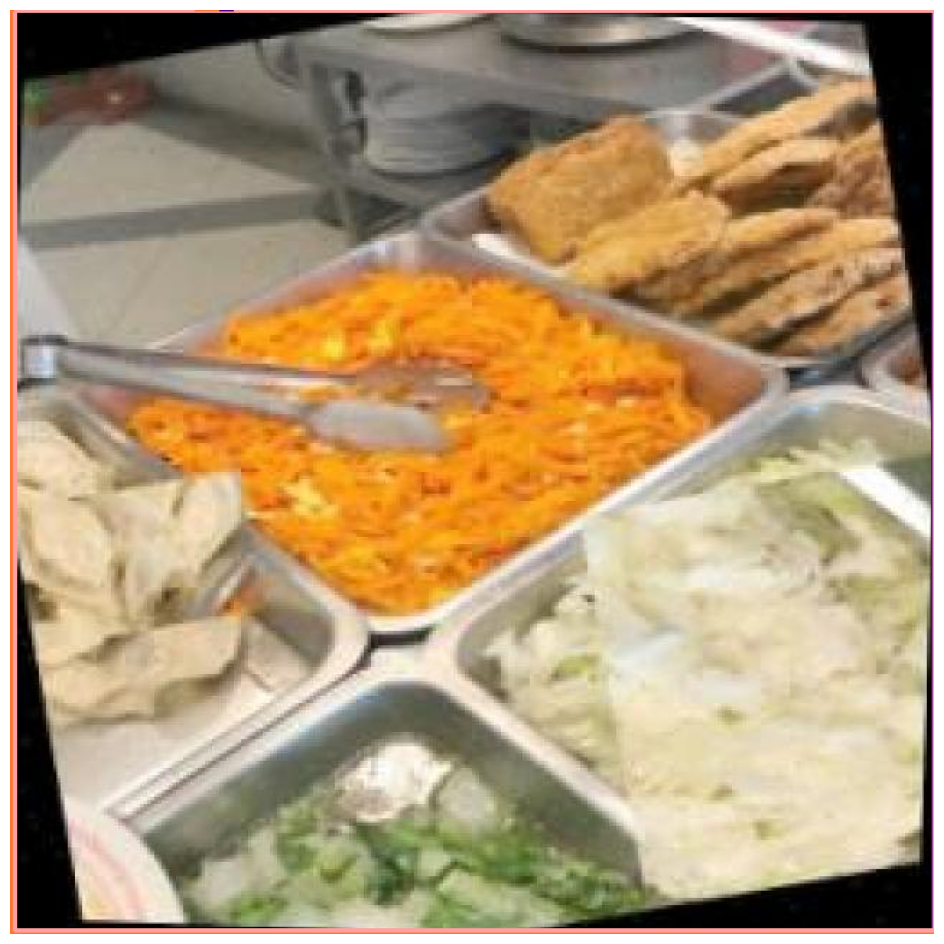

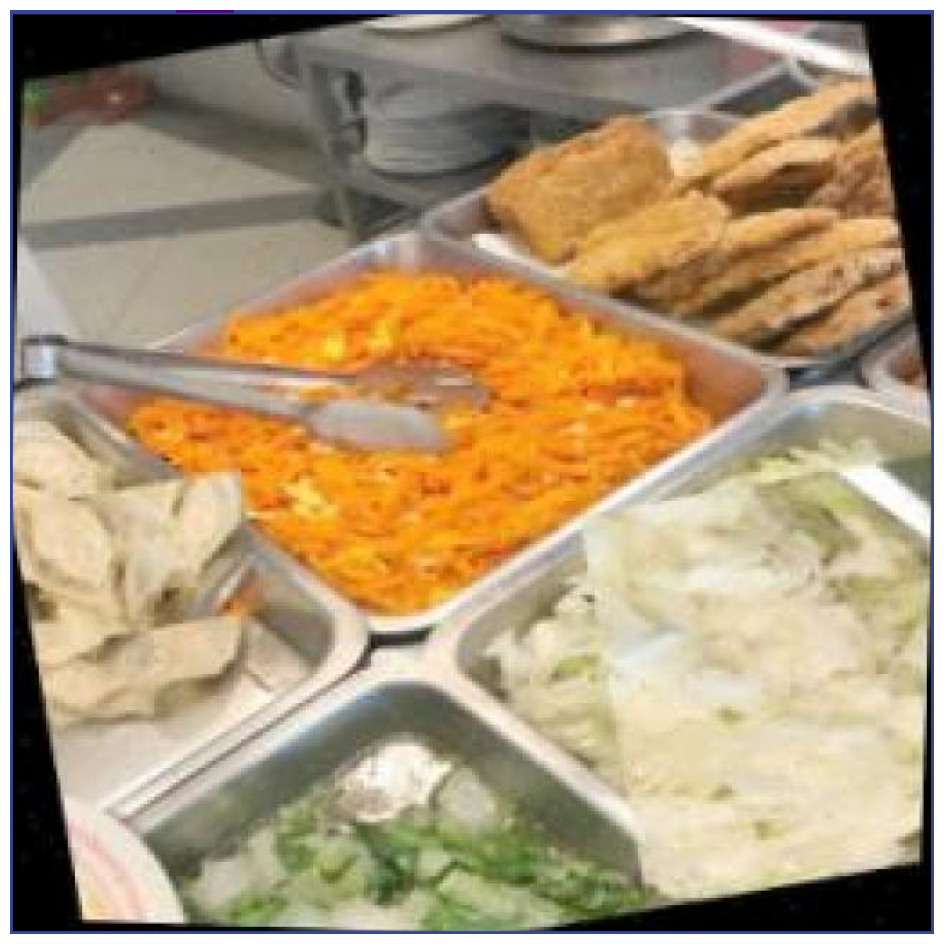

images/water_spinach.jpg


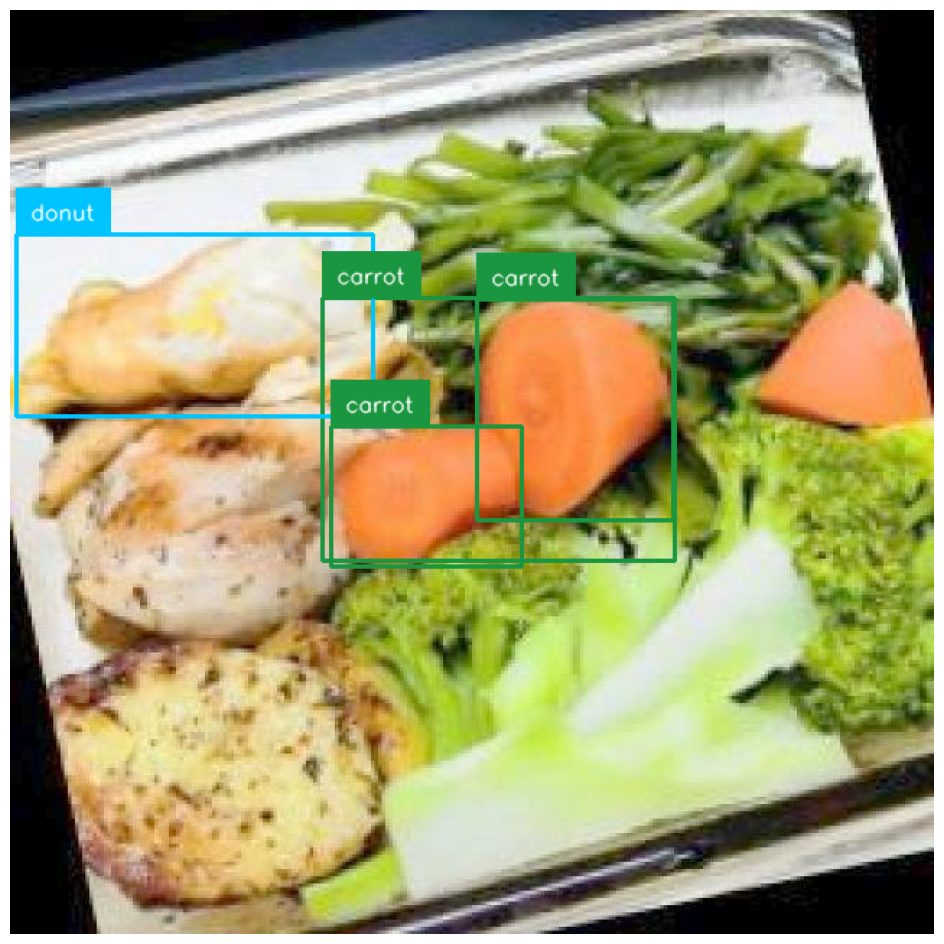

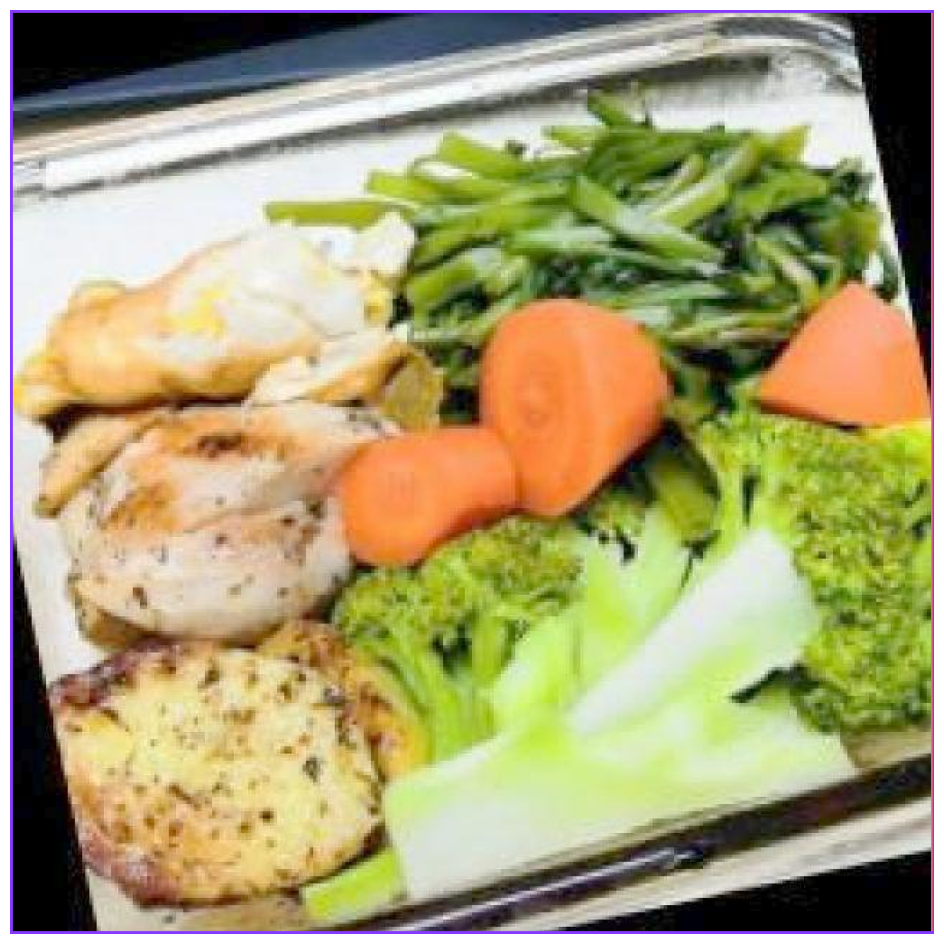

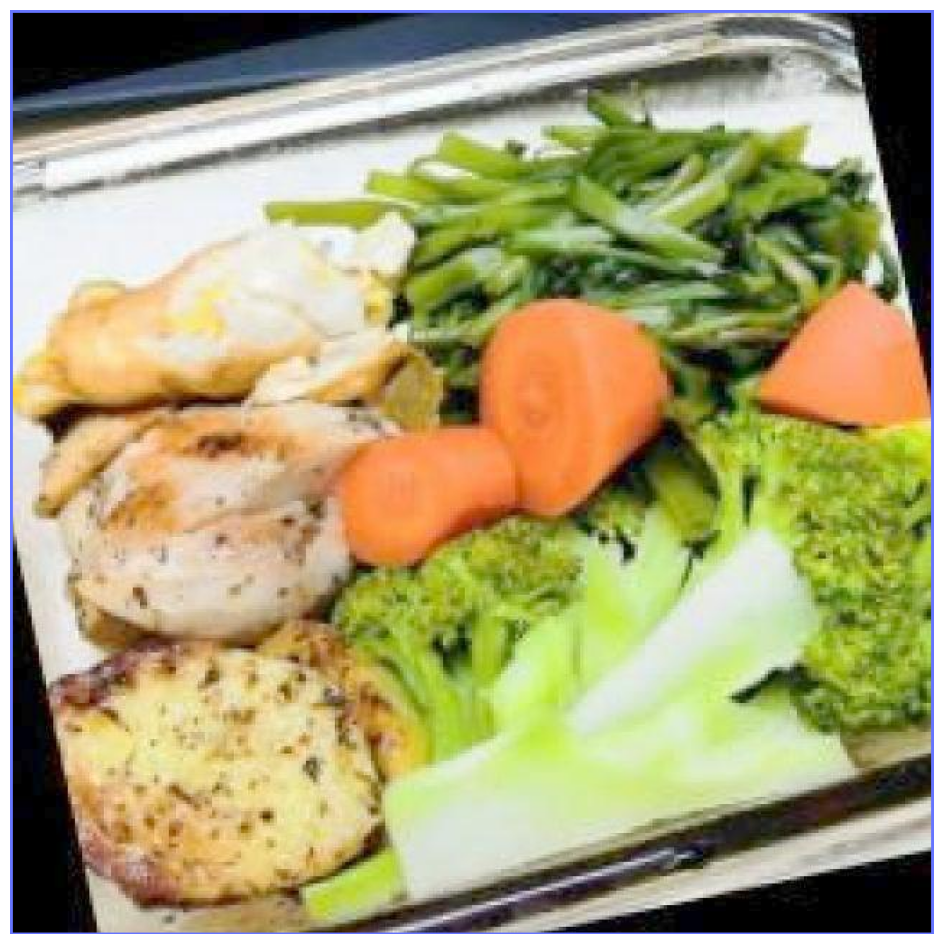

images/chicken_nuggets.jpg


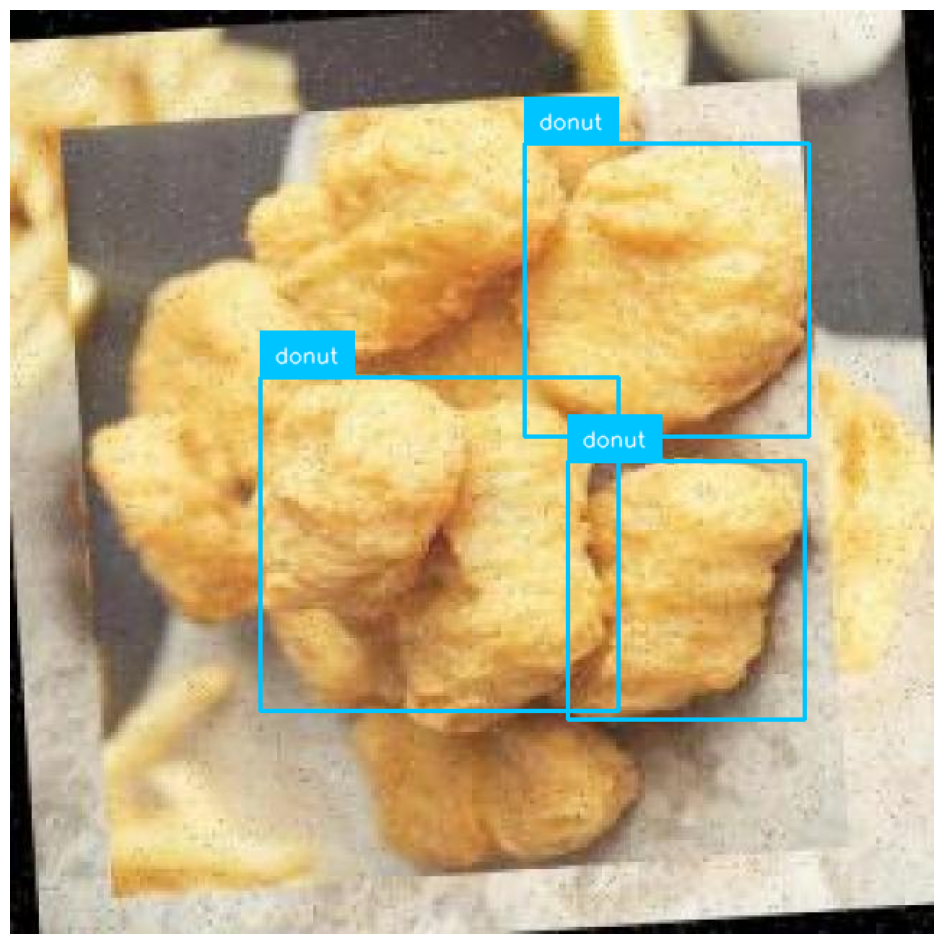

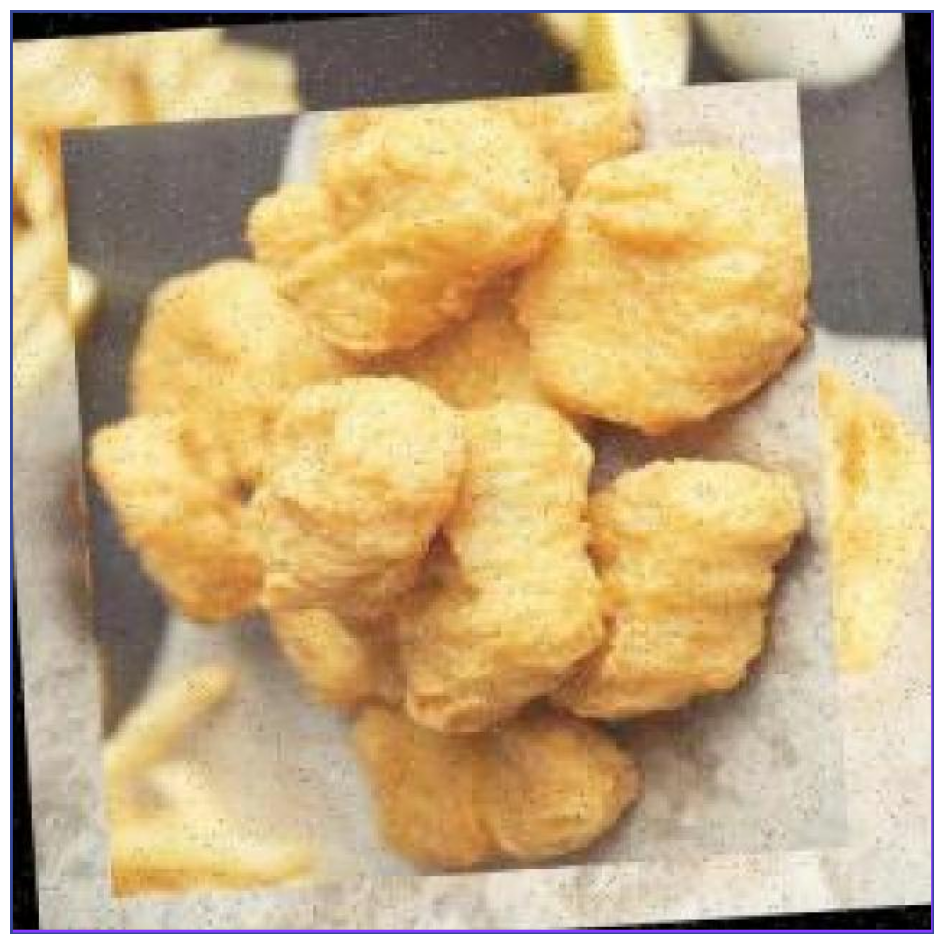

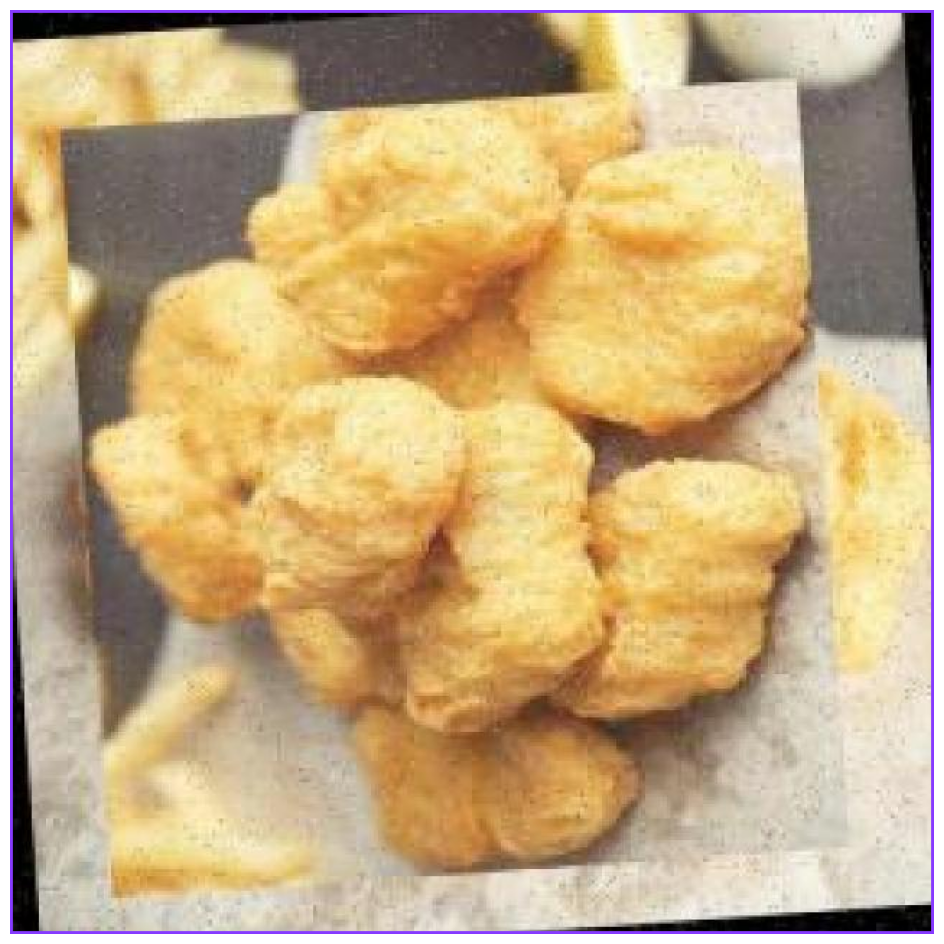

images/fried_chicken.jpg


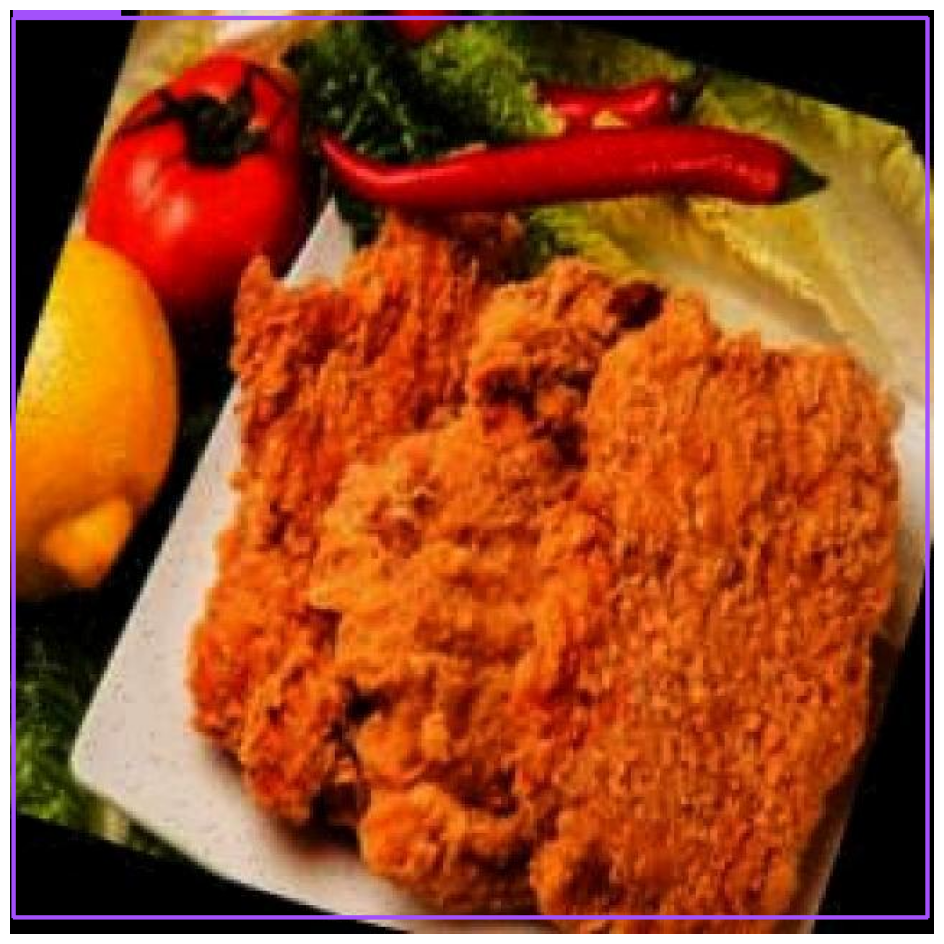

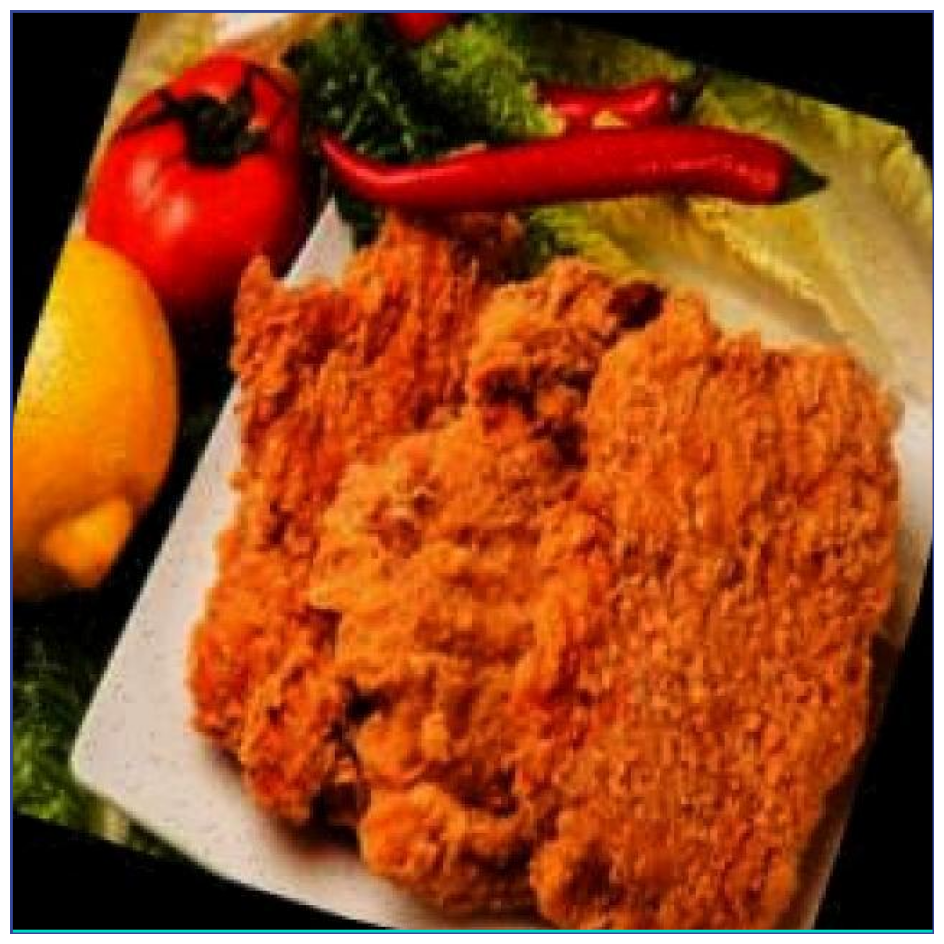

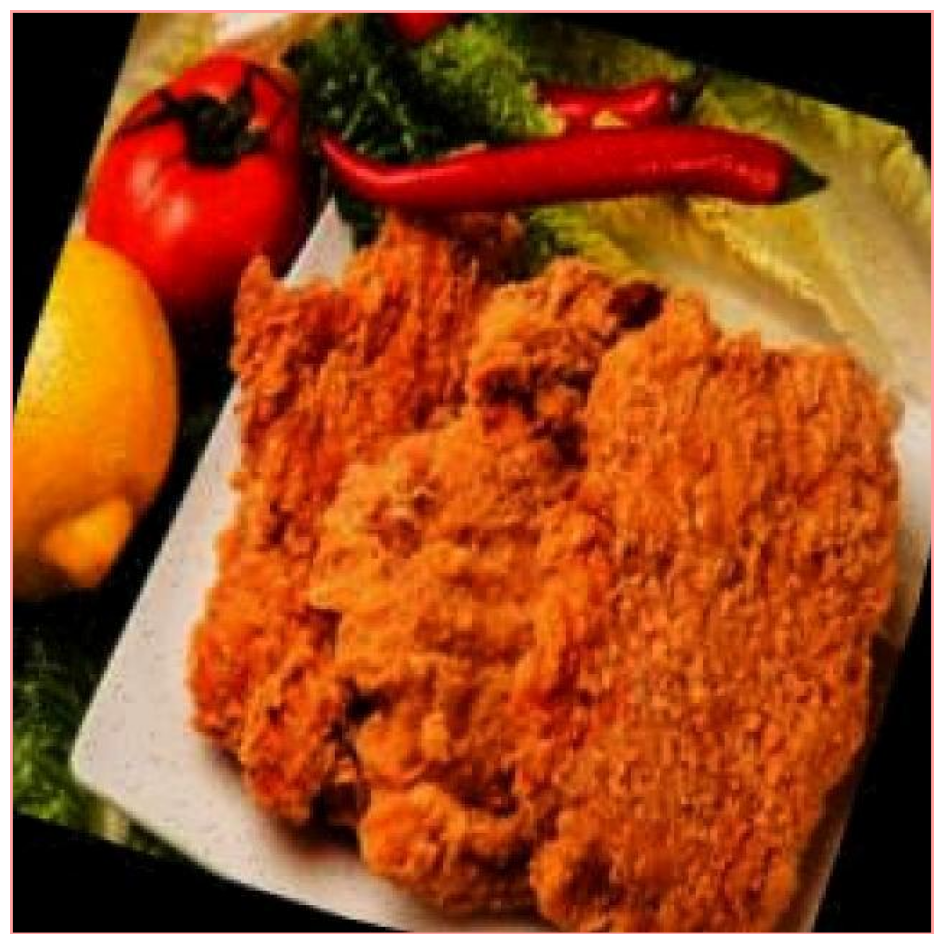

images/fried_dumplings.jpg


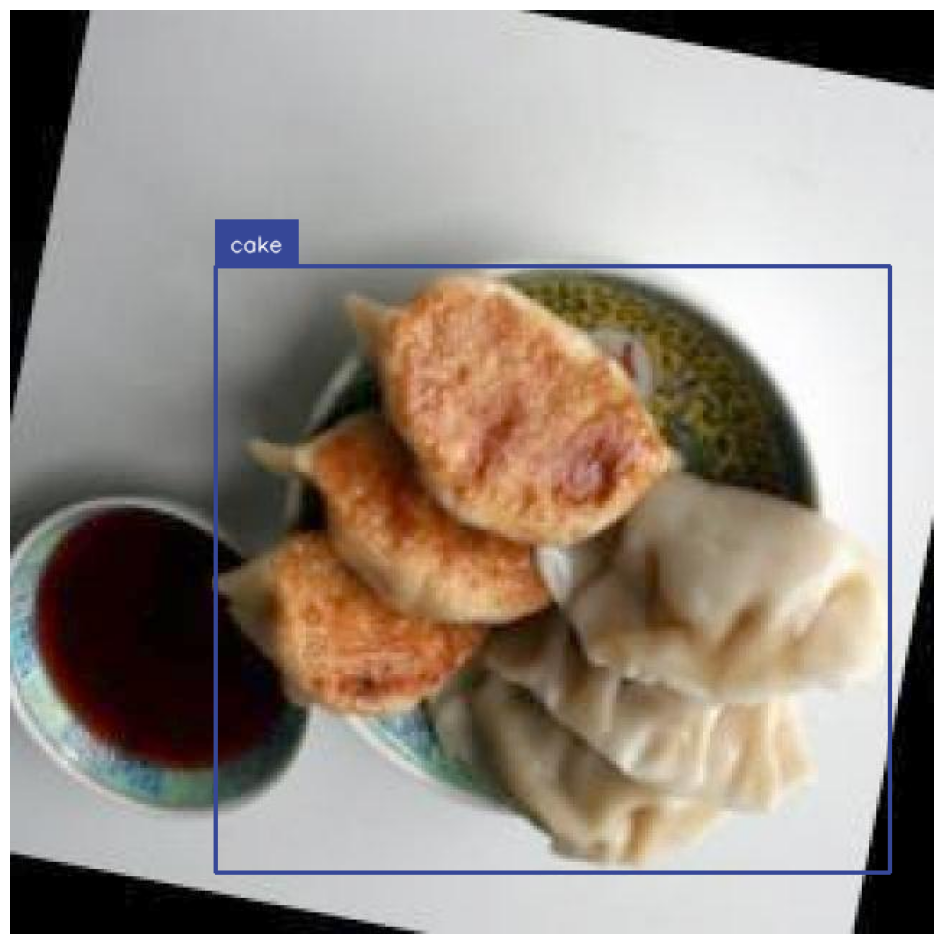

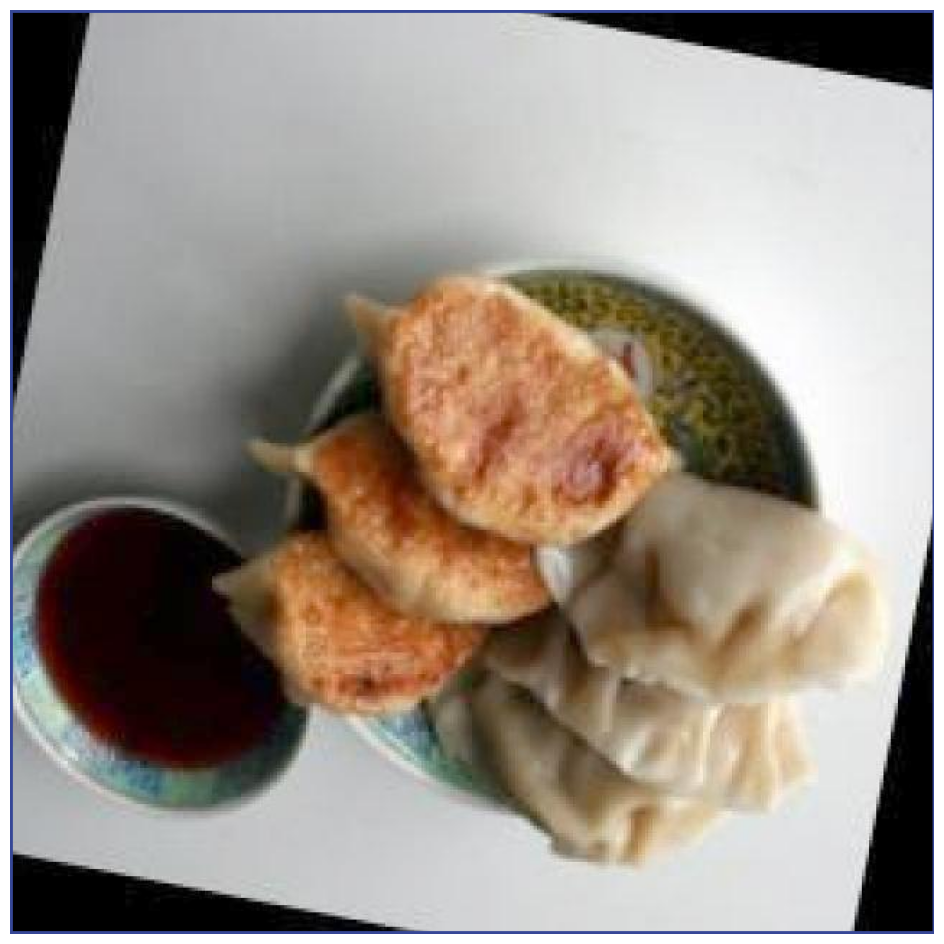

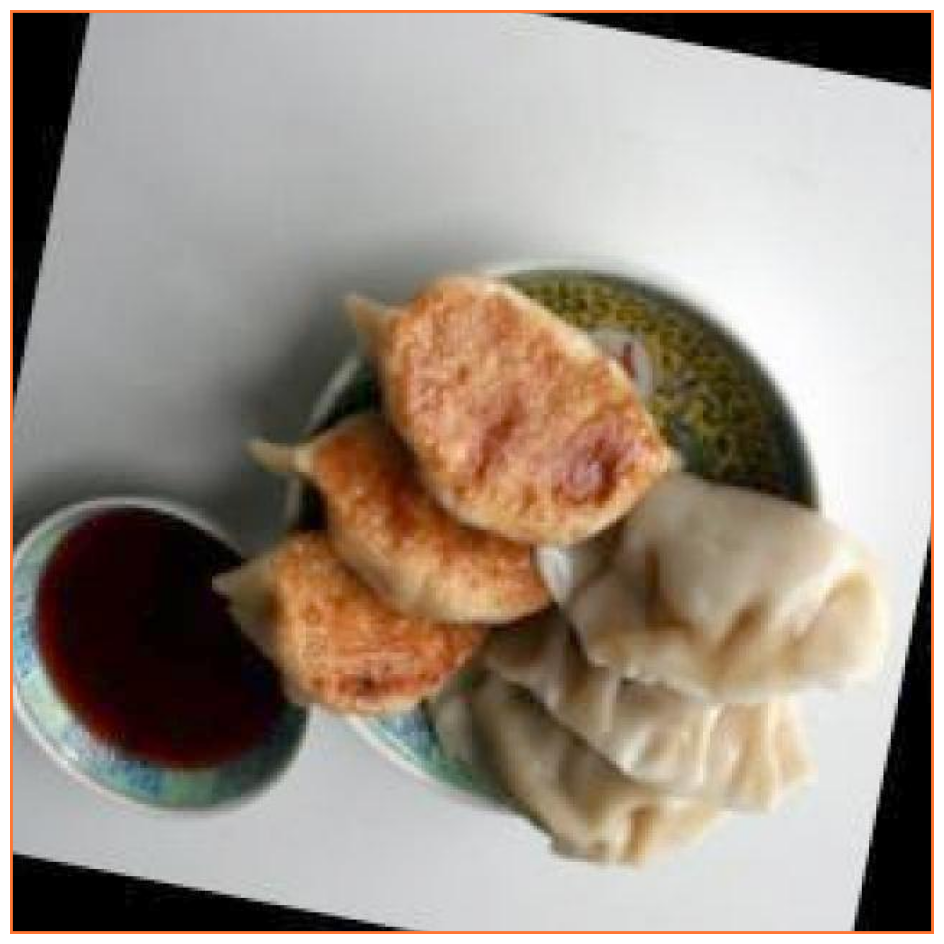

In [10]:
i = 0
for image_path in os.listdir("images"):
    if image_path != '.DS_Store':
        i += 1
        image_path = "images/" + image_path
        print(image_path)
        detect_with_confidence(model_original, image_path)
        detect_with_confidence(model_fine_tuned_8, image_path)
        detect_with_confidence(model_fine_tuned_11, image_path)
        if i == 5:
            break

**As we see, there are no predictions on the images processed by both fine-tuned models. I think it is because they predict very large bounding boxes (equal to the size of the whole image). Hence, we cannot see anything on the pictures**

### Next steps:

+ Continue fine-tuning different models. We need to find the model which will perform the best (probably yolo11x, since this is the largest model out of the whole family of YOLOv11 models).

+ Get more data for fine-tuning, so that the model would be able to recognize the food items better, and it will be able to recognize more food items.

+ Idenfity the proper fine-tuning parameters.

+ Currently the biggest issue is that bounding boxes are predicted very poorly. We need to find the way to fix this issue. For example, we can change the fine-tuning code, and make sure that losses for bounding boxes are properly defined and the model is seriously penalized for predicting wrong bounding boxes.

+ Besides the food detection, we also need to detect the ingredients in the food items. This can be done by using the same approach as for the food detection, but with different labels and different dataset.

+ In addition, we need to do calorie estimation in the future. There are some datasets related to it in roboflow, but we need to check how it is supposed to work